<a href="https://colab.research.google.com/github/rafpang/CB0494/blob/main/C22_10.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#CB0494 Mini Project: HDB Resale Prices in Singapore

###C22 Team 10

Rafi Bintang Pagi Pangestu (U2120642K)

Severiano Steinar Rivandi (U2120172H)


Problem Statement: Figuring out the resale price of an HDB flat given its features.

In [ ]:
import warnings 
warnings.filterwarnings('ignore')

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import numpy as np

#Data Reading

This cell reads the csv files and the `.head()` method to show the first 5 rows of the dataset.

In [ ]:
df = pd.read_csv("resale_flat_prices_based_on_registration_date_from_jan_2017_onwards.csv", error_bad_lines=False)

df.head()

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price
0,2017-01,ANG MO KIO,2 ROOM,406,ANG MO KIO AVE 10,10 TO 12,44.0,Improved,1979,61 years 04 months,232000.0
1,2017-01,ANG MO KIO,3 ROOM,108,ANG MO KIO AVE 4,01 TO 03,67.0,New Generation,1978,60 years 07 months,250000.0
2,2017-01,ANG MO KIO,3 ROOM,602,ANG MO KIO AVE 5,01 TO 03,67.0,New Generation,1980,62 years 05 months,262000.0
3,2017-01,ANG MO KIO,3 ROOM,465,ANG MO KIO AVE 10,04 TO 06,68.0,New Generation,1980,62 years 01 month,265000.0
4,2017-01,ANG MO KIO,3 ROOM,601,ANG MO KIO AVE 5,01 TO 03,67.0,New Generation,1980,62 years 05 months,265000.0


In [ ]:
# Dropping Street Name and block number
df.drop(['block','street_name'], axis=1, inplace=True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 147534 entries, 0 to 147533
Data columns (total 9 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   month                147534 non-null  object 
 1   town                 147534 non-null  object 
 2   flat_type            147534 non-null  object 
 3   storey_range         147534 non-null  object 
 4   floor_area_sqm       147534 non-null  float64
 5   flat_model           147534 non-null  object 
 6   lease_commence_date  147534 non-null  int64  
 7   remaining_lease      147534 non-null  object 
 8   resale_price         147534 non-null  float64
dtypes: float64(2), int64(1), object(6)
memory usage: 10.1+ MB


In [ ]:
#Are there any missing values?

df.isnull().sum()

month                  0
town                   0
flat_type              0
storey_range           0
floor_area_sqm         0
flat_model             0
lease_commence_date    0
remaining_lease        0
resale_price           0
dtype: int64

In [ ]:
#What are the summary statistics of the numerical values

df.describe()

,floor_area_sqm,lease_commence_date,resale_price
count,147534.000000,147534.000000,1.475340e+05
mean,97.588426,1995.523479,4.786904e+05
std,24.087029,13.736309,1.656556e+05
min,31.000000,1966.000000,1.400000e+05
25%,82.000000,1985.000000,3.580000e+05
50%,94.000000,1996.000000,4.488880e+05
75%,113.000000,2007.000000,5.680000e+05
max,249.000000,2019.000000,1.418000e+06


#Some Preprocessing

##Remaining Lease

The `remaining_lease` column is of type string and describes the remaining lease of a given flat. To make it usable for our model, we decide to convert it into floats.

The approach that we are using is using `regex`. The block of code below essentialy does that, and it gives a float corresponding to the remaining lease of that flat. For example, `"5 years and 6 months"` to `5.5` years. 

In [ ]:
#Encoding Remaining Lease

import re
remaining_lease_modified =[]
for index, row in df.iterrows():
  
  numbers = [int(s) for s in re.findall(r'\b\d+\b', row.remaining_lease)]
  if len(numbers) < 2:
    year = numbers[0]
    total = year
  else:
    year, month = numbers[0], numbers[1]
    month_float = month / 12
    total = year + month_float
  remaining_lease_modified.append(total)

df["remaining_lease_modified"] = remaining_lease_modified


## Changing `storey_range`

In the data set, the storey range is written as ranges of values, such as `01 TO 03`, `04 TO 06`, and so on. Each range is of step 2, and is a catogorical variable associated with levels. To make it fit into the boxplot below and make it usable in our machine learning model, we decided to encode them as individual integers. Thus the new `storey_range` will be of integers ranging from 0 to 16, we'll call it "tiers".

- The value of `01 TO 03` changes to 0 
- The value of `04 TO 06` changes to 1
- and so on...  




In [ ]:
#Renaming storey_range to "tiers"
storey_encoding = {}
storey_value = 0
for storey_range in list(np.sort(df.storey_range.unique())):
    storey_encoding[storey_range] = storey_value
    storey_value +=1

df['storey_range'] = df['storey_range'].map(storey_encoding)

#Exploratory Data Analysis

Exploratory data analysis (EDA) used to analyze and summarize the 

data in order to understand its underlying patterns, relationships, and trends. In the context of determining the resale price of an HDB flat, EDA involves examining the data on various factors that may impact the price of the flat, such as location, size, age, and amenities.

The first step in EDA is to collect the data and clean it to ensure that it is accurate and complete. This may involve removing any missing or duplicate values, and converting the data into a suitable format for analysis.

Next, the data can be visualized using various charts and graphs, such as scatter plots, histograms, and box plots. These visualizations can help to identify any patterns or outliers in the data, as well as provide insights into the distribution and variability of the data.

Once the data has been visualized, statistical techniques such as correlation analysis can be used to examine the relationships between different variables, and regression analysis can be used to build models that predict the resale price of the HDB flat based on various factors.



In [ ]:
#Classifying each town to its region using dictionary

print(df['town'].unique())

Regions = {
 'ANG MO KIO': 'north',
 'BEDOK': 'east',
 'BISHAN': 'central',
 'BUKIT BATOK':'west',
 'BUKIT MERAH':'central',
 'BUKIT PANJANG':'west',
 'BUKIT TIMAH':'central',
 'CENTRAL AREA':'central',
 'CHOA CHU KANG':'west',
 'CLEMENTI':'west',
 'GEYLANG':'central',
 'HOUGANG':'north_east',
 'JURONG EAST':'west',
 'JURONG WEST':'west',
 'KALLANG/WHAMPOA':'central',
 'MARINE PARADE':'central',
 'PASIR RIS':'east',
 'PUNGGOL':'north_east',
 'QUEENSTOWN':'central',
 'SEMBAWANG':'north',
 'SENGKANG':'north_east',
 'SERANGOON':'north_east',
 'TAMPINES':'east',
 'TOA PAYOH':'central',
 'WOODLANDS':'north',
 'YISHUN':'north'
}




['ANG MO KIO' 'BEDOK' 'BISHAN' 'BUKIT BATOK' 'BUKIT MERAH' 'BUKIT PANJANG'
 'BUKIT TIMAH' 'CENTRAL AREA' 'CHOA CHU KANG' 'CLEMENTI' 'GEYLANG'
 'HOUGANG' 'JURONG EAST' 'JURONG WEST' 'KALLANG/WHAMPOA' 'MARINE PARADE'
 'PASIR RIS' 'PUNGGOL' 'QUEENSTOWN' 'SEMBAWANG' 'SENGKANG' 'SERANGOON'
 'TAMPINES' 'TOA PAYOH' 'WOODLANDS' 'YISHUN']



This code cell above is a dictionary that categorizes each unique town in the dataset into distinct regions based on their location, utilizing the information provided in the article located at https://www.mappr.co/counties/regions-of-singapore/. The dictionary assigns each town as a key with its corresponding region as the value.

In [ ]:
#Which regions has the largest amount of HDB and how is the resale price

#Regions vs count
RegionData = df[['town','resale_price']]
RegionData['region'] = RegionData.town.map(Regions)


fig = px.histogram(RegionData, 
                   x="region", 
                   width = 700, 
                   height = 700,
                   title = '<b>Counts of HDB per Region</b>')
fig.show()

The histogram depicted above illustrates the number of HDB flats in five distinct regions. It can be seen that the west region has the highest count of HDB flats, with 33.6k units, while the north east region follows closely behind with 33.2k units. On the other hand, the east region has the lowest count of HDB flats, with only 22.4k units.

In [ ]:
#Regions vs Resale Price

fig = px.box(RegionData,
             x = 'region',
             y = "resale_price",
             width = 700,
             height = 700,
             title = '<b>Distribution of resale price per region</b>')
fig.show()

The boxplot displayed above depicts the resale price distribution for each of the five regions. Upon analysis, it can be observed that the resale price distribution for the north, east, west, and north east regions are fairly similar, with median prices ranging from 395k to 470k. However, the central region stands out with a distinctly different resale price distribution compared to the other four regions. The median resale price for the central region is the highest among all regions, at 550k. Furthermore, the distribution for the central region is much more volatile than the other four, as evidenced by the interquartile range, which is substantially larger than the others. Lastly, the central region has a significantly higher upper fence compared to the other regions.

In [ ]:
df['year'] = pd.to_datetime(df['month']).dt.year

year_rp_dict = df[['year','resale_price']].groupby('year').median('resale_price').to_dict()['resale_price']
year_median_rp = pd.DataFrame()
year_median_rp['year']=df.year
year_median_rp['median_resale_price'] = year_median_rp['year'].map(year_rp_dict)

fig = px.line(year_median_rp, x='year', y='median_resale_price', width = 700, height = 700)
fig.update_layout(title='<b>Change of Median Resale Price over Time</b>', 
                  xaxis_title='<b>Year</b>', 
                  yaxis_title='<b>Resale Price (SGD)</b>',
                  title_font=dict(size=15, ),
                  xaxis=dict(title_font=dict(size=12,)),
                  yaxis=dict(title_font=dict(size=12,)))
fig.show()

The line plot above displays the median resale price change from 2017 to 2023, showing an overall increase. However, during the pandemic from 2020 to 2022, there was a sharp increase in the median resale price. While there was still an increase in 2023, it was not as significant, which may suggest a gradual economic recovery. Therefore, we included the listing year as a feature in the machine learning model training.




In [ ]:
fig = px.box(df.sort_values(by='flat_type', ascending=True), x='flat_type', y='resale_price', width = 1200, height = 900, color_discrete_sequence=['#6699CC'])
fig.update_layout(title='<b>Distribution of Resale Price with Flat Type</b>', 
                  xaxis_title='<b>Flat Type</b>', 
                  yaxis_title='<b>Resale Price (SGD)</b>',
                  title_font=dict(size=15),
                  xaxis=dict(title_font=dict(size=12)),
                  yaxis=dict(title_font=dict(size=12)))
fig.show()

The box plot illsutrates the distribution of resale price for different flat type categorizes by the number of rooms in each HDB unit. As the flat type changes with seemingly increasing rooms, the median resale price would increase. This makes sense logically speaking, as it is expected that a flat with more rooms to be valued higher. Additionally, the box plot also shows that flats with 3,4, and 5 rooms tend to have plenty of outliers (values larger than 1.5*IQR) compared to the other flat types. 

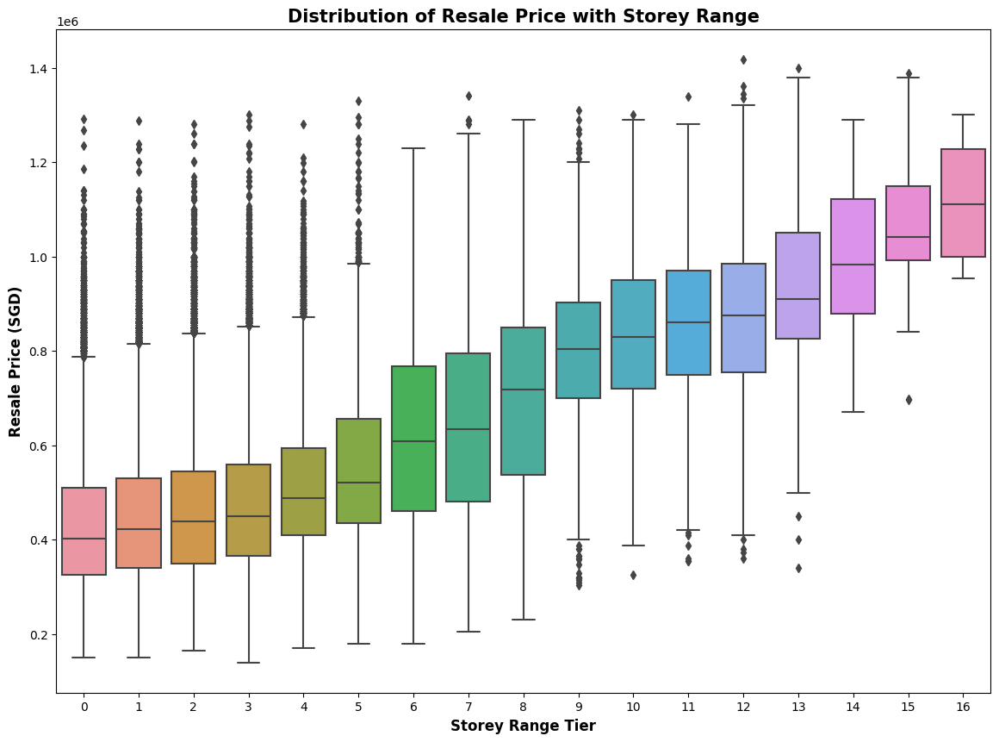

In [ ]:
fig, ax = plt.subplots(figsize=(14,10))
sns.set_style('darkgrid')
boxplot_3 = sns.boxplot(data=df.sort_values(by='storey_range', ascending=True),x='storey_range',y='resale_price')
           
boxplot_3.set_title('Distribution of Resale Price with Storey Range',fontdict={'size': 15,'weight':'bold'})
boxplot_3.set_ylabel("Resale Price (SGD)",fontdict={'size': 12,'weight':'bold'})
boxplot_3.set_xlabel("Storey Range Tier",fontdict={'size': 12,'weight':'bold'})




plt.show()


The displayed box plot presents the resale price distribution for different storey range. The graph indicates that the median resale price tends to increase as the HDB flats are situated at higher floors in the building, which could be related to the view. It is noteworthy that the earlier storey ranges (tier 0 up to tier 5) have more outliers than the later storey ranges.

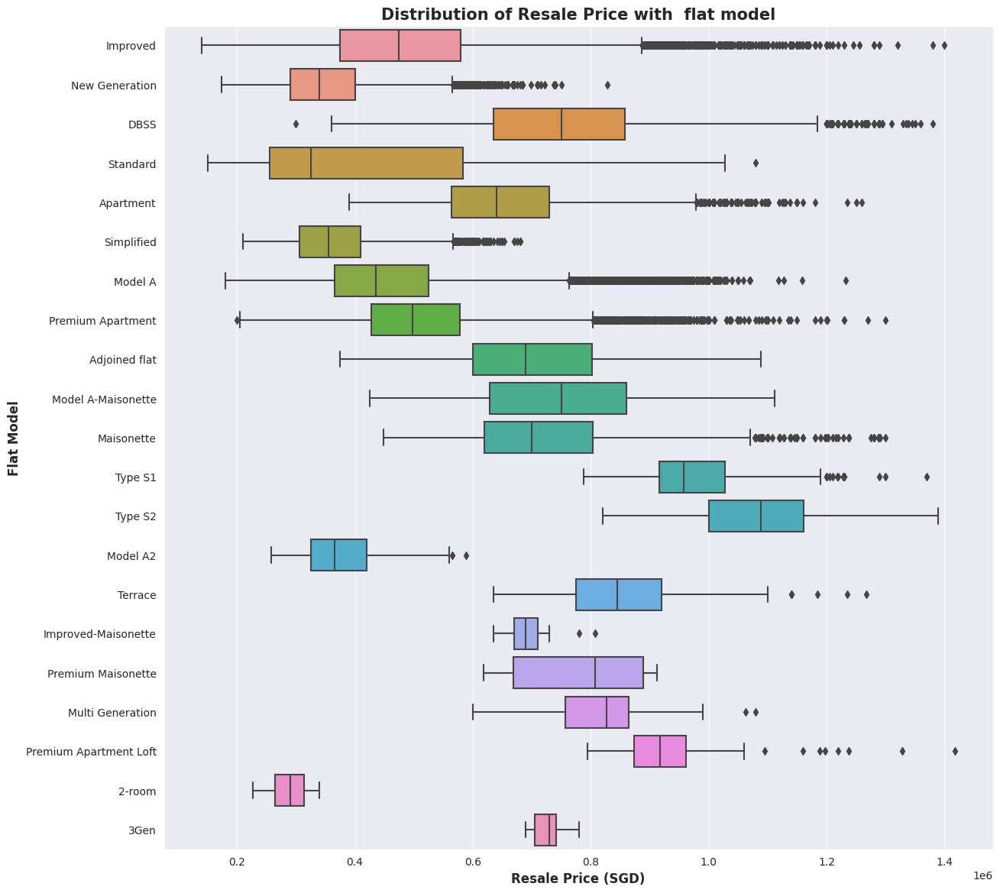

In [ ]:

fig, ax = plt.subplots(figsize=(14,14))


boxplot_6 = sns.boxplot(data=df,y="flat_model", x="resale_price",)
            
boxplot_6.set_title('Distribution of Resale Price with  flat model',fontdict={'size': 15,'weight':'bold'})
boxplot_6.set_xlabel("Resale Price (SGD)",fontdict={'size': 12,'weight':'bold'})
boxplot_6.set_ylabel("Flat Model",fontdict={'size': 12,'weight':'bold'})
plt.show()


The graph above shows the box plot of resale price in comparison to different flat model. 

As can be seen, the the resale price are distributed randomly for each flat model. This is because some flat model occurs more thus creating an uneven distribution of resale price.

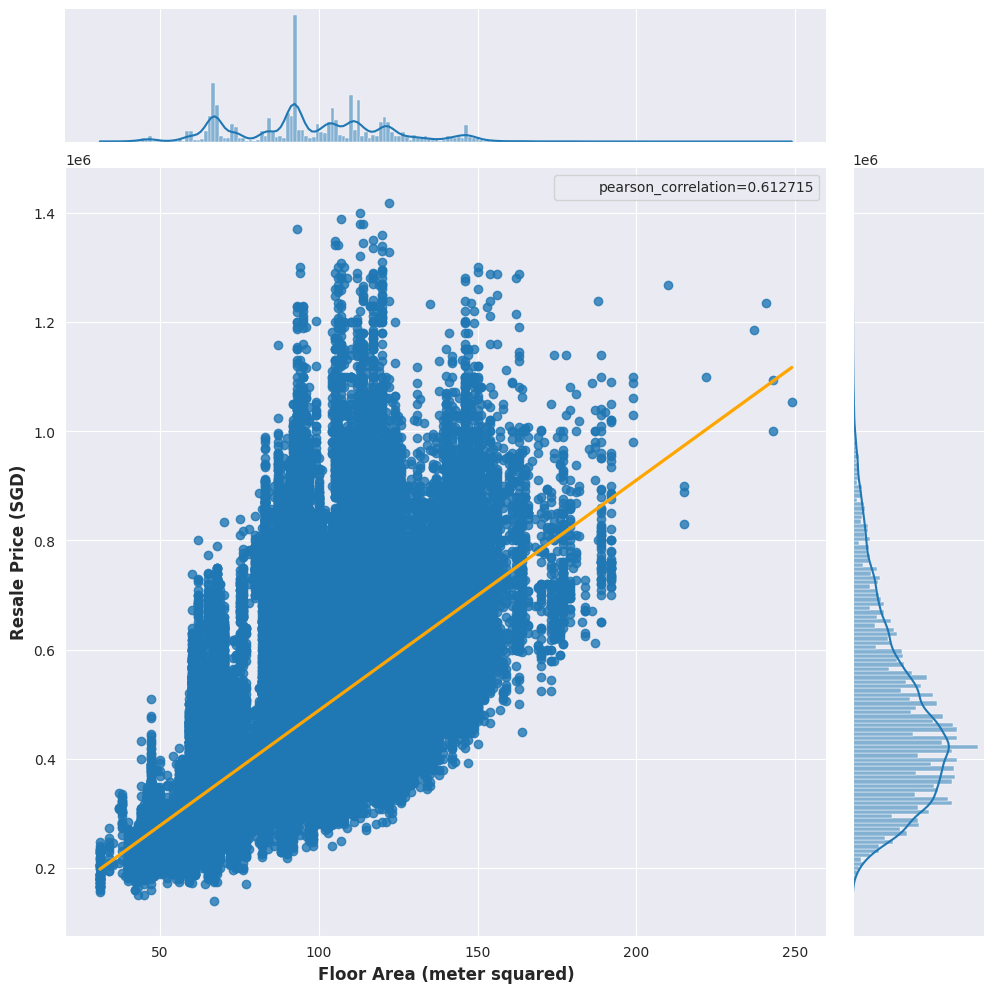

,floor_area_sqm,resale_price
floor_area_sqm,1.000000,0.612715
resale_price,0.612715,1.000000


In [ ]:
# Trend of resale price with area


jointplot_5 = sns.jointplot(data=df, x="floor_area_sqm", y="resale_price",\
                            kind="reg",\
                            height=10,\
                            joint_kws={'line_kws':{'color':'orange'}})

phantom, = jointplot_5.ax_joint.plot([], [], linestyle="", alpha=0)

pearson_correlation = df[['floor_area_sqm','resale_price']].corr().values[1,0]
jointplot_5.ax_joint.legend([phantom],['pearson_correlation={:f}'.format(pearson_correlation)])

jointplot_5.set_axis_labels('Floor Area (meter squared)', 'Resale Price (SGD)',**{'size': 12,'weight':'bold'})

plt.show()

df[['floor_area_sqm', 'resale_price']].corr()

The graph presented above illustrates the joint distribution of floor area and resale price in an HDB housing market. A scatter plot was utilized to create a line of best fit that accurately portrays the relationship between these two variables. The line plot showcases a positive correlation between floor area and resale price, which suggests that there is a significant association between these two factors.

This positive correlation can be attributed to the fundamental economic principles of supply and demand. As the floor area of an HDB flat increases, the supply of housing decreases while the demand for larger living spaces increases, driving up the price of the property. Additionally, larger HDB flats often provide more amenities and space, making them more desirable and valuable to potential buyers.

Therefore, the observed trend of an increasing resale price with an increasing floor area is not only logical but also supported by the economic principles of supply and demand.

Additionally, the distribution of the floor area as well as the distribution of the resale price are presented on the graph located at the top and right side of the scatter plot.

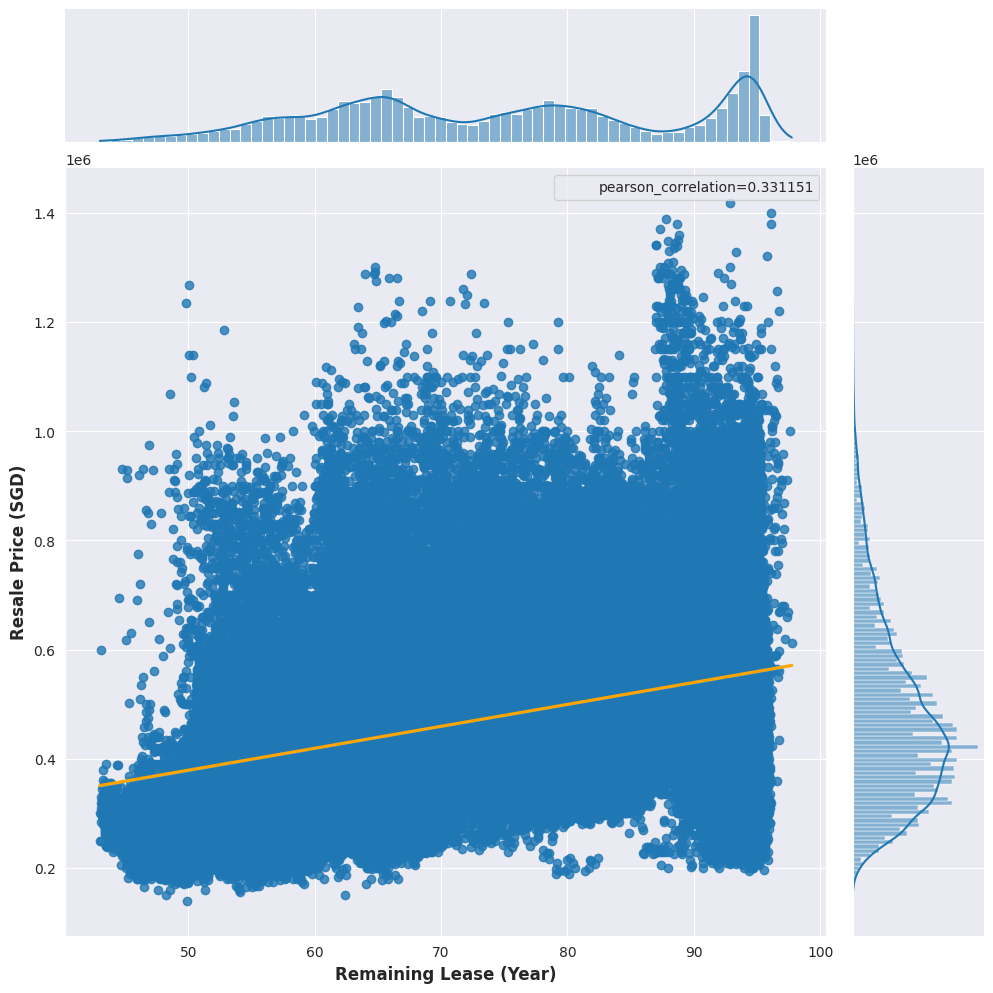

,remaining_lease_modified,resale_price
remaining_lease_modified,1.000000,0.331151
resale_price,0.331151,1.000000


In [ ]:
# Trend of  resale pricelease with commence year


jointplot_4 = sns.jointplot(data=df, x="remaining_lease_modified", y="resale_price",\
                            kind="reg",\
                            height=10,\
                            joint_kws={'line_kws':{'color':'orange'}})

phantom, = jointplot_4.ax_joint.plot([], [], linestyle="", alpha=0)

pearson_correlation = df[['remaining_lease_modified','resale_price']].corr().values[1,0]
jointplot_4.ax_joint.legend([phantom],['pearson_correlation={:f}'.format(pearson_correlation)])

jointplot_4.set_axis_labels('Remaining Lease (Year)', 'Resale Price (SGD)',**{'size': 12,'weight':'bold'})

plt.show()

df[['remaining_lease_modified', 'resale_price']].corr()


The above graph displays the relationship between remaining lease in years and resale price in a HDB housing market. A scatter plot was used to plot the data points, and a line of best fit was created to illustrate the correlation between these two variables. The line plot reveals a positive correlation, indicating that there is a connection between the remaining lease period and the resale price of an HDB flat.

This correlation suggests that the remaining lease period is an important factor in determining the value of an HDB flat. As the remaining lease period decreases, the value of the property also decreases, resulting in a lower resale price. This is because buyers are aware that they will only be able to use the property for a limited time before the lease expires.

Although the correlation depicted on the graph is positive, it is not particularly strong, suggesting that the remaining lease period may not be the most significant factor affecting the resale price of an HDB flat in Singapore. Nonetheless, the remaining lease period is still included in machine learning training models as it does have some impact on the resale price.

Furthermore, the graph also shows the distributions of the remaining lease period and the resale price on the top and right sides of the scatter plot, respectively. These distributions provide a visual representation of the frequency and range of values for each variable

#Other patterns in the dataset

In [ ]:
#What are the most expensive towns by median resale price

town_resale = df[['town','resale_price']].groupby('town').median('resale_price').reset_index()
sorted_median_resale = town_resale.sort_values('resale_price', ascending=False). \
                                  rename(columns={'resale_price':'median_resale_price'}). \
                                  head(5)
sorted_median_resale

,town,median_resale_price
6,BUKIT TIMAH,713888.0
2,BISHAN,642250.0
18,QUEENSTOWN,638000.0
4,BUKIT MERAH,605000.0
7,CENTRAL AREA,538000.0


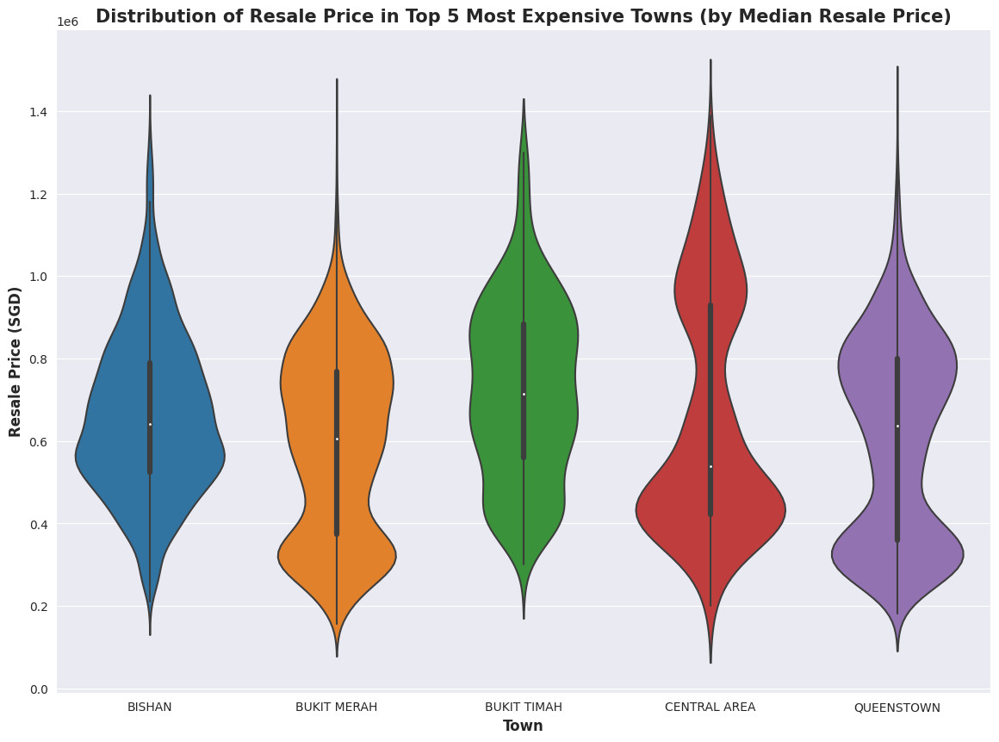

In [ ]:
#Distribution of Resale Price with Top 5 Towns (Highest Mean Resale Price)

five_most_expensive = sorted_median_resale.sort_values('median_resale_price', ascending=False).reset_index().head(5)

resale_price_top5 = df[df['town'].isin(five_most_expensive.town.values)][['town','resale_price']]
sns.set_style('darkgrid')

plt.figure(figsize=(14,10))

violinplot_1 = sns.violinplot(data=resale_price_top5,x="town", y="resale_price")
            
violinplot_1.set_title('Distribution of Resale Price in Top 5 Most Expensive Towns (by Median Resale Price)'\
                        ,fontdict={'size': 15,'weight':'bold'})
violinplot_1.set_ylabel("Resale Price (SGD)",fontdict={'size': 12,'weight':'bold'})
violinplot_1.set_xlabel("Town",fontdict={'size': 12,'weight':'bold'})
    
plt.show()
    

Text(0.5, 1.0, 'Correlation of Features')

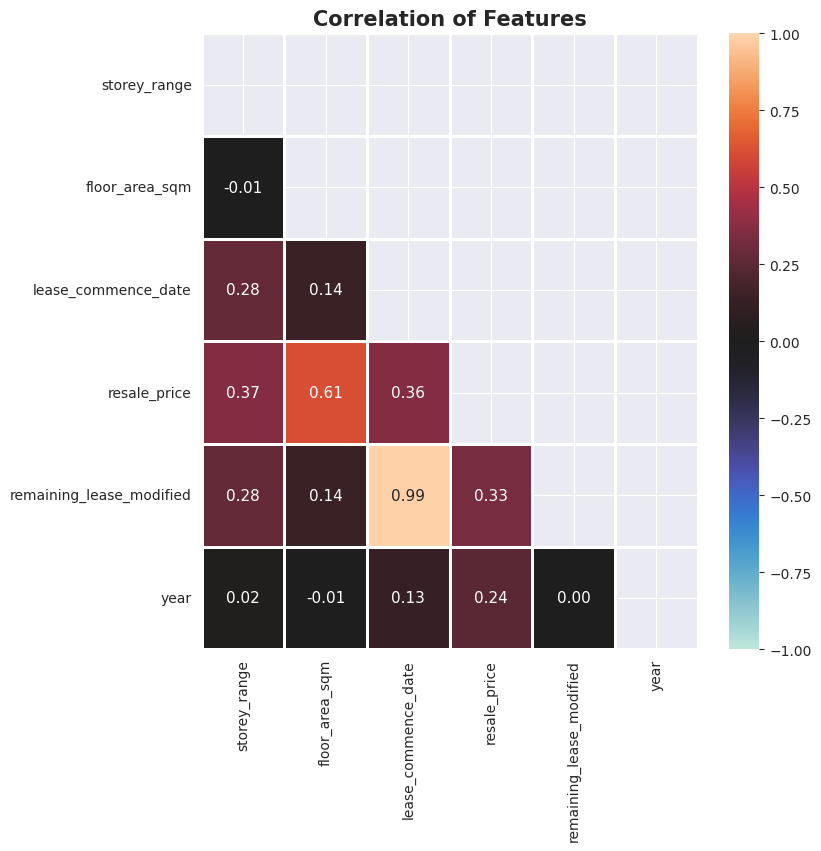

In [ ]:

df_corr = df.corr()

mask = np.triu(np.ones_like(df_corr, dtype=bool)) 
f = plt.figure(figsize = (8,8))
heatmap = sns.heatmap(data = df_corr, mask=mask,vmin = -1, vmax = 1, fmt = ".2f", annot = True, linewidth = 2, annot_kws = {"size" : 11}, cmap = "icefire")

heatmap.set_title('Correlation of Features',fontdict={'size': 15,'weight':'bold'})


The presented heat map displays the correlation among various features from the dataset, such as floor area, lease commence date, remaining lease, storey range, resale price, and year. The heat map has been created to measure the correlation between different features, and based on that correlation, the heat map has been drawn.

According to the heat map, the strongest correlation has been observed between the remaining lease modified and the lease commence date. As the lease period is limited to 105 years, the remaining lease date can be calculated by taking into account the lease commence date and the lease duration.

In addition, a positive correlation has been observed between the floor area and the resale price. This correlation seems logical since larger HDB flats tend to have a higher value in the HDB flat market.

Other significant features in predicting the resale price include the storey range, lease commence date, remaining lease, and year, all of which exhibit positive correlations. Therefore, all these features have been incorporated to train the machine learning model for predicting the resale price based on the values of these features.

#Machine Learning

One last thing before we decide to do our usual train & test split and validation!

The type of rooms are to be encoded into numbers.

In [ ]:
#Encoding room numbers to numerical values
ml_feed = df.copy()

room_encoding = {'1 ROOM':1, '2 ROOM':2,
            '3 ROOM':3, '4 ROOM':4, '5 ROOM':5, 'EXECUTIVE':6, 'MULTI-GENERATION':7}

ml_feed['flat_type'] = ml_feed['flat_type'].map(room_encoding)


In [ ]:
ml_feed.head(5)

,month,town,flat_type,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price,remaining_lease_modified,year
0,2017-01,ANG MO KIO,2,3,44.0,Improved,1979,61 years 04 months,232000.0,61.333333,2017
1,2017-01,ANG MO KIO,3,0,67.0,New Generation,1978,60 years 07 months,250000.0,60.583333,2017
2,2017-01,ANG MO KIO,3,0,67.0,New Generation,1980,62 years 05 months,262000.0,62.416667,2017
3,2017-01,ANG MO KIO,3,1,68.0,New Generation,1980,62 years 01 month,265000.0,62.083333,2017
4,2017-01,ANG MO KIO,3,0,67.0,New Generation,1980,62 years 05 months,265000.0,62.416667,2017


# Training and Validation 

We are going to be approaching the training and validation methods in a more unique way. The approach of feature engineering that we will be using is a target encoding method using the median resale price. The method is explained in greater detail as below:

https://www.kaggle.com/code/ryanholbrook/target-encoding

Instead of the usual `train_test_split` from sklearn, we will be first shuffling the dataset. The randomness is controlled by using a random state. We are going to choose an 90/10 split for the entire data, so we are going to take the first 90% of rows as the training data and the remaining as testing.

In [ ]:
#randomly shuffling our dataset
ml_feed_shuffled = ml_feed.sample(frac=1, random_state = 42)

#90/10 training/test split
training_pct = 0.9

# testing_pct would be 1-training_pct
training_data = ml_feed_shuffled[0:int(len(ml_feed_shuffled)*(training_pct))]
testing_data = ml_feed_shuffled[int(len(ml_feed_shuffled)*(training_pct)):]

In [ ]:
#Making sure that the splitting was done correctly

print(len(training_data)+len(testing_data) == len(ml_feed_shuffled))

True


In [ ]:
#Encoding the respective towns to their median resale price ("Median target encoding")

#This dictionary shall be used in prediction in our predict() function and in our test set.
train_town_encoding = training_data[['town','resale_price']].groupby('town').median('resale_price').to_dict()['resale_price']


#This encodes our X_train with the encoding given
training_data['town'] = training_data['town'].map(train_town_encoding)

In [ ]:
#Encoding the respective flat models to their median resale price ("Median target encoding")

#This dictionary shall be used in prediction in our predict() function and in our test set.
train_flat_encoding = training_data[['flat_model','resale_price']].groupby('flat_model').median('resale_price').to_dict()['resale_price']

#This encodes our X_train with the encoding given
training_data['flat_model'] = training_data['flat_model'].map(train_flat_encoding)


In [ ]:
#Encoding the flat model and the town with the encodings made previously on the testing data
testing_data['flat_model'] = testing_data['flat_model'].map(train_flat_encoding)
testing_data['town'] = testing_data['town'].map(train_town_encoding)



In [ ]:
#Breaking down our training & testing data to features and targets (X, y)

X_train = training_data.copy().drop(columns = ['resale_price','month','remaining_lease','lease_commence_date'])
y_train = training_data.copy()['resale_price']

X_test = testing_data.copy().drop(columns = ['resale_price','month','remaining_lease','lease_commence_date'])
y_test = testing_data.copy()['resale_price']


In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, explained_variance_score

lr_0 = LinearRegression().fit(X_train, y_train)
y_predict_train = lr_0.predict(X_train)
y_predict_test = lr_0.predict(X_test)
r2_score_ols_train = r2_score(y_train, y_predict_train)
r2_score_ols_test = r2_score(y_test, y_predict_test)

mse_ols_train = mean_squared_error(y_train,y_predict_train)
mae_ols_train = mean_absolute_error(y_train, y_predict_train)

mse_ols_test = mean_squared_error(y_test, y_predict_test)
mae_ols_test = mean_absolute_error(y_test, y_predict_test)

ev_ols_train = explained_variance_score(y_train, y_predict_train)
ev_ols_test = explained_variance_score(y_test, y_predict_test)



In [ ]:
print('--------------TRAINING------------------')

print(f'Training R^2: {r2_score_ols_train}')
print(f'Training MSE: {mse_ols_train}')
print(f'Training MAE: {mae_ols_train}')
print(f'Training EV: {ev_ols_train}')


print('\n')
print('--------------TESTING------------------')

print(f'Test R^2: {r2_score_ols_test}')
print(f'Test MSE: {mse_ols_test}')
print(f'Test MAE: {mae_ols_test}')
print(f'Test EV: {ev_ols_test}')



--------------TRAINING------------------
Training R^2: 0.6988797617860707
Training MSE: 8282024223.159795
Training MAE: 69542.83026944145
Training EV: 0.6988797617860707


--------------TESTING------------------
Test R^2: 0.6868591870298759
Test MSE: 8417054611.273595
Test MAE: 70206.55410355912
Test EV: 0.6868764043657452


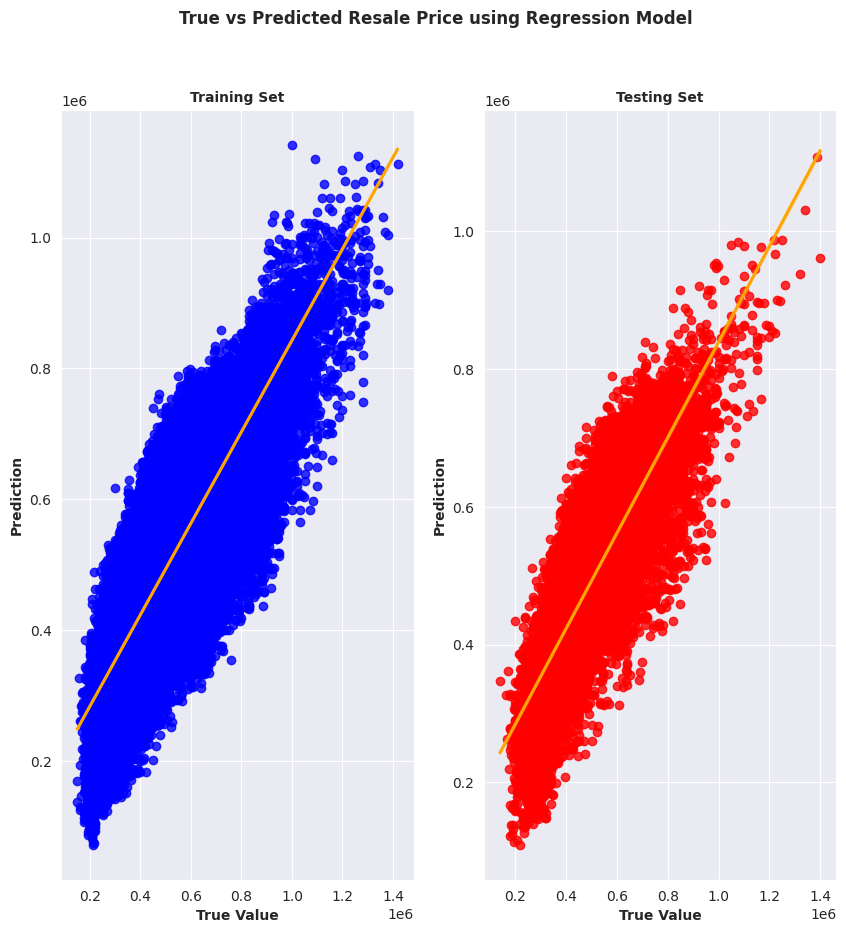

In [ ]:
f, ax = plt.subplots(1,2, figsize=(10,10))

training_results = pd.DataFrame({'y_train':y_train, 'y_predict_train':y_predict_train})
testing_results = pd.DataFrame({'y_test':y_test, 'y_predict_test':y_predict_test})

reg1 = sns.regplot(data=training_results, x='y_train',y='y_predict_train', ax=ax[0], \
                   scatter_kws={"color": "blue"}, line_kws={"color": "orange"})

reg2 = sns.regplot(data=testing_results, x='y_test',y='y_predict_test', ax=ax[1], \
                     scatter_kws={"color": "red"}, line_kws={"color": "orange"})

reg1.set_title('Training Set'\
                        ,fontdict={'size': 10,'weight':'bold'})
reg1.set_ylabel("Prediction",fontdict={'size': 10,'weight':'bold'})
reg1.set_xlabel("True Value",fontdict={'size': 10,'weight':'bold'})


reg2.set_title('Testing Set'\
                        ,fontdict={'size': 10,'weight':'bold'})
reg2.set_ylabel("Prediction",fontdict={'size': 10,'weight':'bold'})
reg2.set_xlabel("True Value",fontdict={'size': 10,'weight':'bold'})

plt.suptitle("True vs Predicted Resale Price using Regression Model", fontweight='bold', fontsize=12)
plt.show()

From the figure, we notice a sufficient agreement between the predicted and the true values of the resale price for both the training and testing sets. The agreement is not perfectly linear, and the errors may be able to be improved by further feature preprocessing, hyperparameter tuning of the linear regression model, or by changing the model. We decided to test Random Forest Regressor on the dataset, and the  r2  value ended up being better.

In [ ]:
#Weights and Biases of the linear regression model

weights_bias = pd.DataFrame({'feature':[*X_train.columns, 'bias (of linear regression)'],
                             'value':[*lr_0.coef_,lr_0.intercept_]})

weights_bias = weights_bias.rename(columns={'town':'med_resale_price_town','flat_model':'med_resale_price_flatmodel'})

weights_bias

,feature,value
0,town,6.637217e-01
1,flat_type,2.187304e+04
2,storey_range,2.169260e+04
3,floor_area_sqm,2.700034e+03
4,flat_model,2.989673e-01
5,remaining_lease_modified,1.513229e+03
6,year,2.242033e+04
7,bias (of linear regression),-4.576048e+07


In [ ]:
#Prediction function
def prediction_lr(town :str,flat_type: str, storey_range:str, floor_area_sqm:int,
                  flat_model:str,remaining_lease_modified:float,year:int) -> float:
  town = town.upper()
  town = train_town_encoding[town]
  flat_type = room_encoding[flat_type.upper()]
  storey_range = storey_range.upper()
  storey_range = storey_encoding[storey_range]
  
  flat_model=train_flat_encoding[flat_model]

  array = pd.DataFrame()
  array['town'] = [town]
  array['flat_type'] = [flat_type]
  array['storey_range'] = [storey_range]
  array['floor_area_sqm'] = [floor_area_sqm]
  array['flat_model'] = [flat_model]
  array['remaining_lease_modified']=[remaining_lease_modified]
  array['year']=[year]
  prediction = lr_0.predict(array)
  return prediction[0]

In [ ]:
prediction_lr('ang mo kio','1 room','01 to 03',44.0,'Improved',61.5,2020)

149904.72421248257

In [ ]:
#Changing the model to RandomForest
from sklearn.ensemble import RandomForestRegressor

xg_0 = RandomForestRegressor(n_estimators=210, max_depth=16).fit(X_train, y_train)
y_predict = xg_0.predict(X_test)
r2_score_ols_train_xg = r2_score(y_train, xg_0.predict(X_train))
r2_score_ols_test_xg = r2_score(y_test, y_predict)

mse_ols_train_xg = mean_squared_error(y_train, xg_0.predict(X_train))
mae_ols_train_xg = mean_absolute_error(y_train, xg_0.predict(X_train))

mse_ols_test_xg = mean_squared_error(y_test, y_predict)
mae_ols_test_xg = mean_absolute_error(y_test, y_predict)

ev_ols_train_xg = explained_variance_score(y_train, xg_0.predict(X_train))
ev_ols_test_xg = explained_variance_score(y_test, y_predict)



In [ ]:
print('--------------TRAINING------------------')

print(f'Training R^2: {r2_score_ols_train_xg}')
print(f'Training MSE: {mse_ols_train_xg}')
print(f'Training RMSE: {mse_ols_train_xg**0.5}')
print(f'Training MAE: {mae_ols_train_xg}')
print(f'Training EV: {ev_ols_train_xg}')

print('\n')
print('--------------TESTING------------------')

print(f'Test R^2: {r2_score_ols_test_xg}')
print(f'Test MSE: {mse_ols_test_xg}')
print(f'Test RMSE: {mse_ols_test_xg**0.5}')
print(f'Test MAE: {mae_ols_test_xg}')
print(f'Test EV: {ev_ols_test_xg}')




--------------TRAINING------------------
Training R^2: 0.9556523070659444
Training MSE: 1219740889.219683
Training RMSE: 34924.78903615143
Training MAE: 24431.192231834306
Training EV: 0.9556536580462536


--------------TESTING------------------
Test R^2: 0.9315540662202202
Test MSE: 1839789445.136901
Test RMSE: 42892.76681606004
Test MAE: 30068.04793247148
Test EV: 0.9315752857345209
